# Analysis the factors related to Publishers on Video Games

Author:Haohong Chenxie

Course Project, UC Irvine, Math 10, S23

## Introduction

The data set I planned to analyze on is a data set about the videos games from 1980 to 2020. I wish to find a way to predict the publisher of a games. The features or variables that may could use by me are "Platform","Year","Genre","NA_Sales",'EU_Sales','JP_Sales','Other_Sales','Global_Sales'.
There are two main problems I aim to solve for the project. 
1)Among those features, Platform and Genre is string type. But those features seem that to have strong relation to the publisher of game, especially platform.  However, both of them are string.                  
2) There will be 8(str and number) or 6(pure number). For this reason I will choose to do Principal component analysis as my extra part since I think that it will be fit to do pca when the date have multiple features.


## Explore the dataset

In [1]:
import pandas as pd

In [2]:
df_game=pd.read_csv("vgsales.csv")
df_game=df_game.dropna(axis=0)

### Display the original dataset

In [3]:
df_game

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37
...,...,...,...,...,...,...,...,...,...,...,...
16593,16596,Woody Woodpecker in Crazy Castle 5,GBA,2002.0,Platform,Kemco,0.01,0.00,0.00,0.00,0.01
16594,16597,Men in Black II: Alien Escape,GC,2003.0,Shooter,Infogrames,0.01,0.00,0.00,0.00,0.01
16595,16598,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,Activision,0.00,0.00,0.00,0.00,0.01
16596,16599,Know How 2,DS,2010.0,Puzzle,7G//AMES,0.00,0.01,0.00,0.00,0.01


In [4]:
df_game.dtypes

Rank              int64
Name             object
Platform         object
Year            float64
Genre            object
Publisher        object
NA_Sales        float64
EU_Sales        float64
JP_Sales        float64
Other_Sales     float64
Global_Sales    float64
dtype: object

In [5]:
df_game["Publisher"].value_counts()

Electronic Arts                 1339
Activision                       966
Namco Bandai Games               928
Ubisoft                          918
Konami Digital Entertainment     823
                                ... 
Glams                              1
Gameloft                           1
Warp                               1
Detn8 Games                        1
Paradox Development                1
Name: Publisher, Length: 576, dtype: int64

### Creating the data for predicting and analysis 

This project will focus on predicting and analysis largest 8 of the publishers instead of all publishers.

In [6]:
lista=list(df_game["Publisher"].value_counts().index)
lista=lista[0:8]
lista

['Electronic Arts',
 'Activision',
 'Namco Bandai Games',
 'Ubisoft',
 'Konami Digital Entertainment',
 'THQ',
 'Nintendo',
 'Sony Computer Entertainment']

In [7]:
df=df_game[df_game["Publisher"].isin(lista)]

In [8]:
df

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37
...,...,...,...,...,...,...,...,...,...,...,...
16567,16570,Fujiko F. Fujio Characters: Great Assembly! Sl...,3DS,2014.0,Action,Namco Bandai Games,0.00,0.00,0.01,0.00,0.01
16568,16571,XI Coliseum,PSP,2006.0,Puzzle,Sony Computer Entertainment,0.00,0.00,0.01,0.00,0.01
16584,16587,Bust-A-Move 3000,GC,2003.0,Puzzle,Ubisoft,0.01,0.00,0.00,0.00,0.01
16591,16594,Myst IV: Revelation,PC,2004.0,Adventure,Ubisoft,0.01,0.00,0.00,0.00,0.01


In [9]:
n=','.join(lista)
print('The dataset is foucs on :')
print(f'{n}.')
print(f'as publishers from {int(df["Year"].min())} to {int(df["Year"].max())}.')

The dataset is foucs on :
Electronic Arts,Activision,Namco Bandai Games,Ubisoft,Konami Digital Entertainment,THQ,Nintendo,Sony Computer Entertainment.
as publishers from 1980 to 2020.


In [10]:
df_game.dtypes

Rank              int64
Name             object
Platform         object
Year            float64
Genre            object
Publisher        object
NA_Sales        float64
EU_Sales        float64
JP_Sales        float64
Other_Sales     float64
Global_Sales    float64
dtype: object

Define list features for both number and string features for the data and feature_num for purely number features.

In [11]:
feature=["Platform","Year","Genre","NA_Sales",'EU_Sales','JP_Sales','Other_Sales','Global_Sales']
feature_num=["Year","NA_Sales",'EU_Sales','JP_Sales','Other_Sales','Global_Sales']

## Visualization by Altair

In [12]:
import altair as alt
alt.data_transformers.enable('default', max_rows=150000)

DataTransformerRegistry.enable('default')

### Publisher vs Global Sales

Among the publisher from 1980 and 2020,Nintendo seem to have most global sales(The earliest game published by Nintendo seems to be “Donkey Kong Jr.” in 1983 according the dataset.The earliest game on the dataset is “Asteroid” by Shooter in 1980, however shooter is not one of 8 largest Publisher from 1980 to 2020.)

In [13]:
alt.Chart(df).mark_bar().encode(x="Publisher",y="Global_Sales")

alt.Chart(...)

The global sales for Activision seem decreased dramatic between 2015 and 2016. The perk for Nintendo reach is 2006.

In [14]:
alt.Chart(df).mark_bar().encode(x="Year:N",y="Global_Sales",tooltip="Year",row="Publisher")


alt.Chart(...)

### Platform vs Global sales

Wii seems to be the most popularized platform from 1980-2020.(surprisingly ,I personally don’t have much memory related to play game on Will, but I think it make sense for it to be most popularized platform considering its vast audience).

In [15]:
alt.Chart(df).mark_bar().encode(x="Platform",y="Global_Sales",tooltip=feature)

alt.Chart(...)

Wii get largely popularized around 2006 and the Sales keep decreasing since then.( I figured that would be the reason why I am less familiar with Wii)

In [16]:
alt.Chart(df).mark_bar().encode(x="Year:N",y="Global_Sales",tooltip="Year",row="Platform")

alt.Chart(...)

### Platform vs Publisher(Genre)

The graph below tells the relation and between Publisher and platform on Genre of the game. 
For example most games on PS4 are action games and Nintendo never published a game on PS4.

In [17]:
c=alt.Chart(df).mark_rect().encode(x="Publisher",y="Platform",color="Genre",tooltip=feature)
c_text=alt.Chart(df).mark_text(size=10).encode(x="Publisher",y="Platform",text="count()")
(c+c_text).properties(
    height=500,
    width=500
)


alt.LayerChart(...)

### Platform vs Publisher(Year and Global Sales)

The graph below tells the relation and between Publisher and platform focus on year and global sale of the game.

In [18]:
s=alt.Chart(df).mark_rect().encode(x="Publisher",y="Platform",color="Year:O",tooltip=feature)
s_text=alt.Chart(df).mark_text(size=20).encode(x="Publisher",y="Platform",text="median(Global_Sales)")
(s+s_text).properties(
    height=500,
    width=500
)


alt.LayerChart(...)

## Machine learning 

Create training set

In [19]:
feature=["Platform","Year","Genre","NA_Sales",'EU_Sales','JP_Sales','Other_Sales','Global_Sales']
feature_num=["Year","NA_Sales",'EU_Sales','JP_Sales','Other_Sales','Global_Sales']

In [20]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [21]:
X_train,X_test,y_train,y_test=train_test_split(df[feature_num],df["Publisher"],test_size=0.3,random_state=2)

In [22]:
X_train

,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
10701,2010.0,0.09,0.00,0.00,0.01,0.10
2844,2010.0,0.18,0.38,0.02,0.13,0.72
6877,2003.0,0.18,0.05,0.00,0.01,0.24
4496,2003.0,0.21,0.17,0.00,0.06,0.43
12827,2002.0,0.04,0.01,0.00,0.00,0.05
...,...,...,...,...,...,...
13718,2005.0,0.02,0.02,0.00,0.01,0.04
6370,2001.0,0.00,0.00,0.26,0.01,0.27
11375,2009.0,0.08,0.00,0.00,0.01,0.08
14422,2008.0,0.00,0.00,0.03,0.00,0.03


In [23]:
y_train

10701                             THQ
2844                       Activision
6877                  Electronic Arts
4496      Sony Computer Entertainment
12827                         Ubisoft
                     ...             
13718                             THQ
6370                         Nintendo
11375                             THQ
14422              Namco Bandai Games
4352     Konami Digital Entertainment
Name: Publisher, Length: 4944, dtype: object

In [24]:

log=LogisticRegression()

## DecisionTreeClassifier

Choosing max-leaf nodes base the changing of accuracy on training set and test set

In [25]:
df_err = pd.DataFrame(columns=["leaves", "error", "set"])
for i in range(2, 60):
    clf = DecisionTreeClassifier(max_leaf_nodes=i)
    clf.fit(X_train, y_train)
    train_error = 1 - clf.score(X_train, y_train)
    test_error = 1 - clf.score(X_test, y_test)
    d_train = {"leaves": i, "error": train_error, "set":"train"}
    d_test = {"leaves": i, "error": test_error, "set":"test"}
    df_err.loc[len(df_err)] = d_train
    df_err.loc[len(df_err)] = d_test


In [26]:

alt.Chart(df_err).mark_line().encode(
    x="leaves",
    y="error",
    color="set",
    tooltip='leaves'

    
)

alt.Chart(...)

Th error increase around 16, choose 15 as the max_leaf nodes.

In [27]:
clf=DecisionTreeClassifier(max_leaf_nodes=15)

In [28]:
clf.fit(X_train,y_train)

DecisionTreeClassifier(max_leaf_nodes=15)

Creating Prediction

In [29]:
df["clf_num"]=clf.predict(df[feature_num])
df

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,clf_num
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74,Nintendo
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,Nintendo
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82,Nintendo
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00,Nintendo
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,Nintendo
...,...,...,...,...,...,...,...,...,...,...,...,...
16567,16570,Fujiko F. Fujio Characters: Great Assembly! Sl...,3DS,2014.0,Action,Namco Bandai Games,0.00,0.00,0.01,0.00,0.01,Activision
16568,16571,XI Coliseum,PSP,2006.0,Puzzle,Sony Computer Entertainment,0.00,0.00,0.01,0.00,0.01,Ubisoft
16584,16587,Bust-A-Move 3000,GC,2003.0,Puzzle,Ubisoft,0.01,0.00,0.00,0.00,0.01,Ubisoft
16591,16594,Myst IV: Revelation,PC,2004.0,Adventure,Ubisoft,0.01,0.00,0.00,0.00,0.01,Ubisoft


Test the accuracy.

In [30]:
clf_overall=clf.score(df[feature_num],df["Publisher"])
clf_overall

0.3492355605889015

In [31]:
clf_test=clf.score(X_test,y_test)
clf_test

0.3292452830188679

In [32]:
clf_train=clf.score(X_train,y_train)
clf_train

0.3578074433656958

confidence of our classifier in this prediction

In [33]:
df["clf_num"].value_counts()

Electronic Arts                 3828
Konami Digital Entertainment    1078
Ubisoft                          841
Nintendo                         660
Namco Bandai Games               357
Activision                       300
Name: clf_num, dtype: int64

### Confusion Matrix

Since there is more than two variables for the input feature. I think is better using the confusion matrix between the publisher and predict.

In [34]:


c = alt.Chart(df).mark_rect().encode(
    x="Publisher:N",
    y=alt.Y("clf_num:N"), #scale=alt.Scale(zero=False)),
    color=alt.Color("count()", scale = alt.Scale(scheme="spectral",reverse=True)),
    tooltip=feature

)

c_text = alt.Chart(df).mark_text(color="white").encode(
    x="Publisher:N",
    y=alt.Y("clf_num:N", scale=alt.Scale(zero=False)),
    text="count()"
)

(c+c_text).properties(
    height=400,
    width=400
)

alt.LayerChart(...)

### Note

There is two problem for the Confusion matrix :
1) It not a square. 
2) The color doesn’t change among square. This note is here to explain the reasons why the two problem occurred 

Why it not a square?

In [35]:
clf.classes_

array(['Activision', 'Electronic Arts', 'Konami Digital Entertainment',
       'Namco Bandai Games', 'Nintendo', 'Sony Computer Entertainment',
       'THQ', 'Ubisoft'], dtype=object)

In [36]:
df["clf_num"].unique()

array(['Nintendo', 'Electronic Arts', 'Activision',
       'Konami Digital Entertainment', 'Namco Bandai Games', 'Ubisoft'],
      dtype=object)

Seems that Sony Computer Entertainment and THQ never got predicted.

Why the color do not changed?

In [37]:
 alt.Chart(df.head(10)).mark_rect().encode(
    x="Publisher:N",
    y=alt.Y("clf_num:N"), #scale=alt.Scale(zero=False)),
    color=alt.Color("NA_Sales:Q", scale = alt.Scale(scheme="turbo",reverse=True)),
    tooltip=feature

)

alt.Chart(...)

In [38]:
 alt.Chart(df.head(50)).mark_rect().encode(
    x="Publisher:N",
    y=alt.Y("clf_num:N"), #scale=alt.Scale(zero=False)),
    color=alt.Color("NA_Sales:Q", scale = alt.Scale(scheme="turbo",reverse=True)),
    tooltip=feature

)



alt.Chart(...)

In [39]:
 alt.Chart(df.head(1000)).mark_rect().encode(
    x="Publisher:N",
    y=alt.Y("clf_num:N"), #scale=alt.Scale(zero=False)),
    color=alt.Color("NA_Sales:Q", scale = alt.Scale(scheme="turbo",reverse=True)),
    tooltip=feature

)

alt.Chart(...)

In [40]:
df["NA_Sales"].max()

41.49

In [41]:
df["NA_Sales"].min()

0.0

In [42]:
df["NA_Sales"].std()

1.1123018867361392

In [43]:
df["NA_Sales"].mean()

0.38376274065685156

In [44]:
df["NA_Sales"].median()

0.13

Using NA-sales as example. Although the there significance difference between max and min. The value for mean,median and std tells us that most data base on sale are very similar.

### Important feature

In [45]:
clf.feature_importances_

array([0.12689473, 0.21873572, 0.03680367, 0.50969041, 0.05230785,
       0.05556761])

In [46]:
feature_num

['Year', 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales']

Note:Since there is too many input feature it may take longer than expected to graph it(about 30 seconds) and the size need to be adjust for the graph.

In [47]:
#import matplotlib.pyplot as plt
#from sklearn.tree import plot_tree

#fig = plt.figure(figsize=(20,10))
#_ = plot_tree(clf, 
                   #feature_names=clf.feature_names_in_,
                   #filled=False)

### Random  Forest

In [48]:
df_err1 = pd.DataFrame(columns=["leaves", "error", "set"])
for i in range(2, 60):
    r =RandomForestClassifier(n_estimators=30,max_leaf_nodes=i)
    r.fit(X_train, y_train)
    train_error = 1 - r.score(X_train, y_train)
    test_error = 1 - r.score(X_test, y_test)
    d_train = {"leaves": i, "error": train_error, "set":"train"}
    d_test = {"leaves": i, "error": test_error, "set":"test"}
    df_err1.loc[len(df_err1)] = d_train
    df_err1.loc[len(df_err1)] = d_test


In [49]:
import altair as alt
alt.Chart(df_err1).mark_line().encode(
    x="leaves",
    y="error",
    color="set",
    tooltip='leaves'

    
)

alt.Chart(...)

Chose 12 as the leaf node.

In [50]:
rfc=RandomForestClassifier(n_estimators=60,max_leaf_nodes=12)

In [51]:
rfc.fit(X_train,y_train)

RandomForestClassifier(max_leaf_nodes=12, n_estimators=60)

Predict the data

In [52]:
df['rfc_num']=rfc.predict(df[feature_num])
df

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,clf_num,rfc_num
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74,Nintendo,Nintendo
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,Nintendo,Nintendo
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82,Nintendo,Nintendo
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00,Nintendo,Nintendo
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,Nintendo,Nintendo
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16567,16570,Fujiko F. Fujio Characters: Great Assembly! Sl...,3DS,2014.0,Action,Namco Bandai Games,0.00,0.00,0.01,0.00,0.01,Activision,Namco Bandai Games
16568,16571,XI Coliseum,PSP,2006.0,Puzzle,Sony Computer Entertainment,0.00,0.00,0.01,0.00,0.01,Ubisoft,Namco Bandai Games
16584,16587,Bust-A-Move 3000,GC,2003.0,Puzzle,Ubisoft,0.01,0.00,0.00,0.00,0.01,Ubisoft,Ubisoft
16591,16594,Myst IV: Revelation,PC,2004.0,Adventure,Ubisoft,0.01,0.00,0.00,0.00,0.01,Ubisoft,Ubisoft


In [53]:
rfc_overall=rfc.score(df[feature_num],df["Publisher"])
rfc_overall

0.3673556058890147

In [54]:
rfc_train=rfc.score(X_train,y_train)
rfc_train

0.3743932038834951

In [55]:
rfc_test=rfc.score(X_test,y_test)
rfc_test

0.35094339622641507

In [56]:
1/12

0.08333333333333333

### Confusion Matrix

Note this time it is a square, which mean all value got preidct.

In [57]:

alt.data_transformers.enable('default', max_rows=15000)

c = alt.Chart(df).mark_rect().encode(
    x="Publisher:N",
    y=alt.Y("rfc_num:N", scale=alt.Scale(zero=False)),
    color=alt.Color("count()", scale = alt.Scale(scheme="spectral",reverse=True)),
    tooltip=feature

)

c_text = alt.Chart(df).mark_text(color="white").encode(
    x="Publisher:N",
    y=alt.Y("rfc_num:N", scale=alt.Scale(zero=False)),
    text="count()"
)

(c+c_text).properties(
    height=400,
    width=400
)

alt.LayerChart(...)

## Convert string feature using Label Encoder

LabelEncoder

In [58]:
from sklearn.preprocessing import LabelEncoder

In [59]:
lb=LabelEncoder()

In [60]:
df1=df.apply(LabelEncoder().fit_transform)

In [61]:
df1

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,clf_num,rfc_num
0,0,4438,21,26,10,4,349,285,193,141,540,4,4
1,1,3651,10,5,4,4,348,247,212,77,539,4,4
2,2,2132,21,28,6,4,345,284,194,139,538,4,4
3,3,4440,21,29,10,4,344,283,189,138,537,4,4
4,4,2906,5,16,7,4,339,278,214,94,536,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16567,7059,1251,2,34,0,3,0,0,1,0,0,0,3
16568,7060,4533,16,26,5,5,0,0,1,0,0,5,3
16584,7061,411,7,23,5,7,1,0,0,0,0,5,6
16591,7062,2419,11,24,1,7,1,0,0,0,0,5,6


In [62]:
df1.dtypes

Rank            int64
Name            int64
Platform        int64
Year            int64
Genre           int64
Publisher       int64
NA_Sales        int64
EU_Sales        int64
JP_Sales        int64
Other_Sales     int64
Global_Sales    int64
clf_num         int64
rfc_num         int64
dtype: object

Change the name of Pubishers and game name back to str

In [63]:
df1["Publisher"]=df["Publisher"]
df1["Name"]=df["Name"]

In [64]:
df1

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,clf_num,rfc_num
0,0,Wii Sports,21,26,10,Nintendo,349,285,193,141,540,4,4
1,1,Super Mario Bros.,10,5,4,Nintendo,348,247,212,77,539,4,4
2,2,Mario Kart Wii,21,28,6,Nintendo,345,284,194,139,538,4,4
3,3,Wii Sports Resort,21,29,10,Nintendo,344,283,189,138,537,4,4
4,4,Pokemon Red/Pokemon Blue,5,16,7,Nintendo,339,278,214,94,536,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16567,7059,Fujiko F. Fujio Characters: Great Assembly! Sl...,2,34,0,Namco Bandai Games,0,0,1,0,0,0,3
16568,7060,XI Coliseum,16,26,5,Sony Computer Entertainment,0,0,1,0,0,5,3
16584,7061,Bust-A-Move 3000,7,23,5,Ubisoft,1,0,0,0,0,5,6
16591,7062,Myst IV: Revelation,11,24,1,Ubisoft,1,0,0,0,0,5,6


### Decision Tree Classifier with the new features

In [65]:
feature

['Platform',
 'Year',
 'Genre',
 'NA_Sales',
 'EU_Sales',
 'JP_Sales',
 'Other_Sales',
 'Global_Sales']

Create training and test set

In [66]:
X_train1,X_test1,y_train1,y_test1=train_test_split(df1[feature],df1["Publisher"],test_size=0.3,random_state=2)

In [67]:
df_err2 = pd.DataFrame(columns=["leaves", "error", "set"])
for i in range(2, 60):
    clf = DecisionTreeClassifier(max_leaf_nodes=i)
    clf.fit(X_train1, y_train1)
    train_error = 1 - clf.score(X_train1, y_train1)
    test_error = 1 - clf.score(X_test1, y_test1)
    d_train = {"leaves": i, "error": train_error, "set":"train"}
    d_test = {"leaves": i, "error": test_error, "set":"test"}
    df_err2.loc[len(df_err2)] = d_train
    df_err2.loc[len(df_err2)] = d_test


In [68]:
import altair as alt
alt.Chart(df_err2).mark_line().encode(
    x="leaves",
    y="error",
    color="set",
    tooltip='leaves'

    
)

alt.Chart(...)

In [69]:
clf=DecisionTreeClassifier(max_leaf_nodes=15)

In [70]:
clf.fit(X_train1,y_train1)

DecisionTreeClassifier(max_leaf_nodes=15)

In [71]:
df["clf_label"]=clf.predict(df1[feature])

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


### Important Features

Note that platform seems to be a important feature when predicting the publisher.

In [72]:
for i in range(len(feature)):
    print({feature[i]:clf.feature_importances_[i]})

{'Platform': 0.30935752930628396}
{'Year': 0.035746473865162796}
{'Genre': 0.18910034621184718}
{'NA_Sales': 0.13765804773942483}
{'EU_Sales': 0.0}
{'JP_Sales': 0.2963885974408185}
{'Other_Sales': 0.0}
{'Global_Sales': 0.03174900543646255}


Compare the confidence with predicting without platform and genre as featrue with same max leaf node

In [73]:
clf2_overall=clf.score(df1[feature],df1["Publisher"])
clf2_overall

0.4135050962627407

In [74]:
clf2_overall>=clf_overall

True

In [75]:
clf2_test=clf.score(X_test1,y_test1)
clf2_test>=clf_test

True

### Confusion Matrix

In [76]:


c = alt.Chart(df).mark_rect().encode(
    x="Publisher:N",
    y=alt.Y("clf_label", scale=alt.Scale(zero=False)),
    color=alt.Color("count():N", scale = alt.Scale(scheme="spectral",reverse=False)),
    tooltip=feature

)

c_text = alt.Chart(df).mark_text(color="white").encode(
    x="Publisher:N",
    y=alt.Y("clf_label", scale=alt.Scale(zero=False)),
    text="count()"
)

(c+c_text).properties(
    height=400,
    width=400
)

alt.LayerChart(...)

### Extra: Principal component analysis

In [77]:
import numpy as np
import matplotlib as plt

In [78]:
from sklearn.preprocessing import StandardScaler

In [79]:
sc=StandardScaler()

Creating a data set with purely number.

In [80]:
df2=df.apply(LabelEncoder().fit_transform)

In [81]:
df2

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,clf_num,rfc_num,clf_label
0,0,4438,21,26,10,4,349,285,193,141,540,4,4,4
1,1,3651,10,5,4,4,348,247,212,77,539,4,4,4
2,2,2132,21,28,6,4,345,284,194,139,538,4,4,4
3,3,4440,21,29,10,4,344,283,189,138,537,4,4,4
4,4,2906,5,16,7,4,339,278,214,94,536,4,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16567,7059,1251,2,34,0,3,0,0,1,0,0,0,3,6
16568,7060,4533,16,26,5,5,0,0,1,0,0,5,3,5
16584,7061,411,7,23,5,7,1,0,0,0,0,5,6,6
16591,7062,2419,11,24,1,7,1,0,0,0,0,5,6,1


Creating training and test sets.

In [82]:
X = df2.loc[:, feature].values
y = df2.loc[:, "Publisher"].values

In [83]:
X_train2,X_test2,y_train2,y_test2=train_test_split(X,y,test_size=0.3,random_state=12)

In [84]:
X_train2=sc.fit_transform(X_train2)
X_test2=sc.fit_transform(X_test2)


In [85]:
from sklearn.decomposition import PCA

In [86]:
pca = PCA(n_components = 2)
 
X_train2 = pca.fit_transform(X_train2)
X_test2= pca.transform(X_test2)
 
explained_variance = pca.explained_variance_ratio_

In [87]:
X_train2.shape

(4944, 2)

In [88]:
from sklearn.linear_model import LogisticRegression 
 
classifier = LogisticRegression(random_state = 0)
classifier.fit(X_train2, y_train2)

LogisticRegression(random_state=0)

In [89]:
y_pred = classifier.predict(X_test2)

In [90]:
y_pred

array([3, 3, 1, ..., 1, 1, 3])

In [91]:
from sklearn.metrics import confusion_matrix
 
cm = confusion_matrix(y_test2, y_pred)
cm

array([[  0, 168,  13,  69,  11,   0,   0,  38],
       [  0, 256,  49,  47,  18,   0,   0,  17],
       [  0,  72,  57,  89,  21,   0,   0,  15],
       [  0,  76,  24, 125,  25,   0,   0,  34],
       [  0,  52,  34,  17,  88,   0,   0,   4],
       [  0, 105,  32,  42,  24,   0,   0,   3],
       [  0, 132,  25,  50,   2,   0,   0,  11],
       [  0, 150,  29,  75,   1,   0,   0,  20]])

In [92]:
import numpy as np
import matplotlib.pyplot as plt

In [93]:
df["Publisher"].value_counts()

Electronic Arts                 1339
Activision                       966
Namco Bandai Games               928
Ubisoft                          918
Konami Digital Entertainment     823
THQ                              712
Nintendo                         696
Sony Computer Entertainment      682
Name: Publisher, dtype: int64

In [94]:
df2["Publisher"].value_counts()

1    1339
0     966
3     928
7     918
2     823
6     712
4     696
5     682
Name: Publisher, dtype: int64

### Graph for Training sets

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

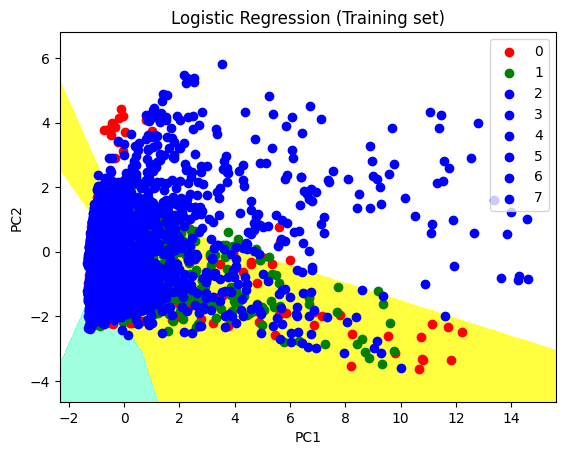

In [95]:
from matplotlib.colors import ListedColormap
 
X_set, y_set = X_train2, y_train2
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1,
                     stop = X_set[:, 0].max() + 1, step = 0.01),
                     np.arange(start = X_set[:, 1].min() - 1,
                     stop = X_set[:, 1].max() + 1, step = 0.01))
 
plt.contourf(X1, X2, classifier.predict(np.array([X1.ravel(),
             X2.ravel()]).T).reshape(X1.shape), alpha = 0.75,
             cmap = ListedColormap(('yellow', 'white', 'aquamarine')))
 
plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())
 
for i, j in enumerate(np.unique(y_set)):
    plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
                c = ListedColormap(('red', 'green', 'blue'))(i), label = j)
 
plt.title('Logistic Regression (Training set)')
plt.xlabel('PC1') 
plt.ylabel('PC2') 
plt.legend() 
 
# show scatter plot
plt.show()

### Graph for Test sets

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

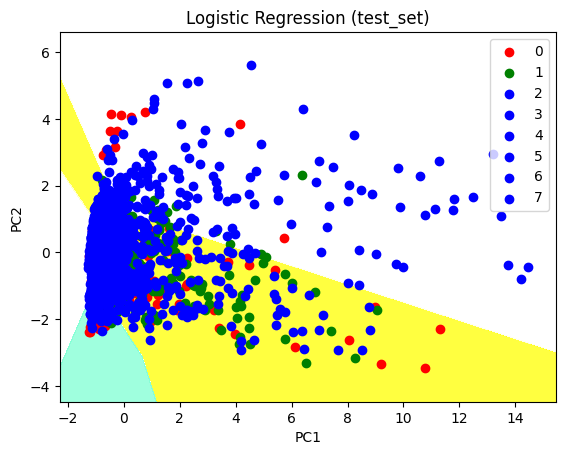

In [96]:
X_set, y_set = X_test2, y_test2
 
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1,
                     stop = X_set[:, 0].max() + 1, step = 0.01),
                     np.arange(start = X_set[:, 1].min() - 1,
                     stop = X_set[:, 1].max() + 1, step = 0.01))
 
plt.contourf(X1, X2, classifier.predict(np.array([X1.ravel(),
             X2.ravel()]).T).reshape(X1.shape), alpha = 0.75,
             cmap = ListedColormap(('yellow', 'white', 'aquamarine')))
 
plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())
 
for i, j in enumerate(np.unique(y_set)):
    plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
                c = ListedColormap(('red', 'green', 'blue'))(i), label = j)
 
# title for scatter plot
plt.title('Logistic Regression (test_set)')
plt.xlabel('PC1') # for Xlabel
plt.ylabel('PC2') # for Ylabel
plt.legend()
 

plt.show()

What does the points 1,2...7 represent is the publishers. For instance,0 stand for Nintendo. As for PC1 and PC2, there is no real world meaning to those.

In [97]:
df2["Publisher"].value_counts()

1    1339
0     966
3     928
7     918
2     823
6     712
4     696
5     682
Name: Publisher, dtype: int64

In [98]:
df["Publisher"].value_counts()

Electronic Arts                 1339
Activision                       966
Namco Bandai Games               928
Ubisoft                          918
Konami Digital Entertainment     823
THQ                              712
Nintendo                         696
Sony Computer Entertainment      682
Name: Publisher, dtype: int64

## Summary

Either summarize what you did, or summarize the results.  Maybe 3 sentences.

For this project, I am focus on attempting to solve two problem:
First problem is to dealing with the non number feature when graphing or make predictions.
I used label encoder to convert str feature to number. So it can be use a input to predicting. 
As for graphing the relationship between non-number variables,I inspired by how we graph confusion matrix. And make the graph that represent the overlap or intersex between two non-number variables 

Second problem is to find visual representation when there more than two features for prediction,
For the second problem. I those to do confusion matrix between the pred value and real value to represent the accuracy of prediction.(Although the matrix looks weird partly because the data I choose).
I also choose do PCA when graphing. Although the there is about 8 features, it can be covert to PC1, and PC2 when graphing it with PCA. However I can’t find a better to represent the name for publisher on the graph other than using numbers.

## References

Your code above should include references.  Here is some additional space for references.

* What is the source of your dataset(s)?

Video Game Sales by GREGORYSMITH: https://www.kaggle.com/datasets/gregorut/videogamesales

* List any other references that you found helpful.

Principal Component Analysis with Python by Akashkumar17:https://www.geeksforgeeks.org/principal-component-analysis-with-python/

## Submission

Using the Share button at the top right, **enable Comment privileges** for anyone with a link to the project. Then submit that link on Canvas.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=63769c53-90b1-4b32-928e-3b6df1e67b85' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>